In [2]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.preprocessing import LabelEncoder, OneHotEncoder

## Reading the input files, create DF and each column datatypes

In [3]:
data_txn = pd.read_csv('Dataset/transaction_output.csv')
data_customer = pd.read_csv('Dataset/Customer.csv')
print('----------Txn info---------------')
print(data_txn.info())
print(data_txn.columns)
print(data_txn.shape)
print('--------------Cust_info-----------')
print(data_customer.info())
print(data_customer.columns)
print(data_customer.shape)

----------Txn info---------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 49861 entries, 0 to 49860
Data columns (total 23 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   ID                 49861 non-null  object 
 1   COMPANY            49861 non-null  object 
 2   BRANCH             49861 non-null  object 
 3   OPERATION_CORE_ID  49861 non-null  object 
 4   PRODUCT_ID         49861 non-null  int64  
 5   OPERATION_CODE     49861 non-null  int64  
 6   OPERATION_DATE     49861 non-null  object 
 7   CURRENCY           49861 non-null  object 
 8   CURRENCY_AMOUNT    49861 non-null  float64
 9   AMOUNT             49861 non-null  float64
 10  ACCOUNT_ID         49861 non-null  int64  
 11  CUST_ID            49861 non-null  int64  
 12  DEBIT_CREDIT_FLAG  49861 non-null  object 
 13  TRANSACTION_REF    49861 non-null  object 
 14  RISK_LEVEL         49861 non-null  int64  
 15  STATE              13071 non-null  o

## Column name include the spaces, removing those spaces

In [4]:
data_txn.columns = data_txn.columns.str.replace(' ', '')
data_customer.columns = data_customer.columns.str.replace(' ', '')
print(data_customer.info())
print(data_txn.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3233 entries, 0 to 3232
Data columns (total 8 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   CUST_ID        3233 non-null   int64  
 1   CIF_RECORD_ID  3233 non-null   int64  
 2   CITY           3223 non-null   object 
 3   STATE          990 non-null    object 
 4   COUNTRY        3224 non-null   object 
 5   BIRTH_DATE     2134 non-null   object 
 6   CRE_TIME       3233 non-null   object 
 7   RISK_LEVEL     3214 non-null   float64
dtypes: float64(1), int64(2), object(5)
memory usage: 202.2+ KB
None
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 49861 entries, 0 to 49860
Data columns (total 23 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   ID                 49861 non-null  object 
 1   COMPANY            49861 non-null  object 
 2   BRANCH             49861 non-null  object 
 3   OPERATION_CORE_ID  49861 non-nu

## Convert Birth_date , operation_date, Open_date to datetime stamp

In [5]:
data_txn['OPERATION_DATE'] = pd.to_datetime(data_txn['OPERATION_DATE'])
data_txn['OPEN_DATE'] = pd.to_datetime(data_txn['OPEN_DATE'])
data_customer['BIRTH_DATE'] = pd.to_datetime(data_customer['BIRTH_DATE'])
print(data_customer.info())
print(data_txn.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3233 entries, 0 to 3232
Data columns (total 8 columns):
 #   Column         Non-Null Count  Dtype         
---  ------         --------------  -----         
 0   CUST_ID        3233 non-null   int64         
 1   CIF_RECORD_ID  3233 non-null   int64         
 2   CITY           3223 non-null   object        
 3   STATE          990 non-null    object        
 4   COUNTRY        3224 non-null   object        
 5   BIRTH_DATE     2134 non-null   datetime64[ns]
 6   CRE_TIME       3233 non-null   object        
 7   RISK_LEVEL     3214 non-null   float64       
dtypes: datetime64[ns](1), float64(1), int64(2), object(4)
memory usage: 202.2+ KB
None
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 49861 entries, 0 to 49860
Data columns (total 23 columns):
 #   Column             Non-Null Count  Dtype         
---  ------             --------------  -----         
 0   ID                 49861 non-null  object        
 1   COMPANY          

## Function to print value counts for each column in a DataFrame


In [6]:
def print_value_counts(df):
    for column in df.columns:
        print(f"Value counts for column: {column}")
        print(df[column].value_counts())
        print()
print("Value counts for data_txn_cust_df DataFrame:")
print_value_counts(data_customer)

Value counts for data_txn_cust_df DataFrame:
Value counts for column: CUST_ID
CUST_ID
1000016    2
1000174    2
1000033    2
1000053    2
1000082    2
          ..
1002190    1
1002125    1
1002154    1
1002157    1
1005905    1
Name: count, Length: 3037, dtype: int64

Value counts for column: CIF_RECORD_ID
CIF_RECORD_ID
73      1
2232    1
2222    1
2223    1
2224    1
       ..
1154    1
1155    1
1156    1
1157    1
3305    1
Name: count, Length: 3233, dtype: int64

Value counts for column: CITY
CITY
DUBAI                   123
CHARLESTOWN, NEVIS       92
KUALA LUMPUR             86
SINGAPORE                71
LONDON                   67
                       ... 
PARANA                    1
ALBROOK                   1
SEDALIA                   1
ANCON                     1
UNITED ARAB EMIRATES      1
Name: count, Length: 1222, dtype: int64

Value counts for column: STATE
STATE
NEVIS        63
FLORIDA      37
DUBAI        35
PICHINCHA    25
GUAYAS       22
             ..
SOHAG    

### As you see above, cust_id count should be unique but we have duplicate records in it. So deleting the duplicate records.

In [7]:
data_customer_unique = data_customer.drop_duplicates(subset=['CUST_ID'], keep='last')
data_customer_unique.shape

(3037, 8)

## mergecustomer and txn data

In [8]:
data_txn_cust_df = pd.merge(data_txn, data_customer_unique, on='CUST_ID', suffixes=('_trans', '_cust'))
print(data_txn_cust_df.info())
print(data_txn_cust_df.shape)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 49861 entries, 0 to 49860
Data columns (total 30 columns):
 #   Column             Non-Null Count  Dtype         
---  ------             --------------  -----         
 0   ID                 49861 non-null  object        
 1   COMPANY            49861 non-null  object        
 2   BRANCH             49861 non-null  object        
 3   OPERATION_CORE_ID  49861 non-null  object        
 4   PRODUCT_ID         49861 non-null  int64         
 5   OPERATION_CODE     49861 non-null  int64         
 6   OPERATION_DATE     49861 non-null  datetime64[ns]
 7   CURRENCY           49861 non-null  object        
 8   CURRENCY_AMOUNT    49861 non-null  float64       
 9   AMOUNT             49861 non-null  float64       
 10  ACCOUNT_ID         49861 non-null  int64         
 11  CUST_ID            49861 non-null  int64         
 12  DEBIT_CREDIT_FLAG  49861 non-null  object        
 13  TRANSACTION_REF    49861 non-null  object        
 14  RISK_L

## Check the null values

In [9]:
data_txn_cust_df.isna().sum()

ID                       0
COMPANY                  0
BRANCH                   0
OPERATION_CORE_ID        0
PRODUCT_ID               0
OPERATION_CODE           0
OPERATION_DATE           0
CURRENCY                 0
CURRENCY_AMOUNT          0
AMOUNT                   0
ACCOUNT_ID               0
CUST_ID                  0
DEBIT_CREDIT_FLAG        0
TRANSACTION_REF          0
RISK_LEVEL_trans         0
STATE_trans          36790
FISCAL_COUNTRY           0
OPEN_DATE              191
ACCOUNT_CURRENCY       191
BALANCE                207
ACCOUNT_TYPE           191
PRODUCT_CODE           191
FRAUD                    0
CIF_RECORD_ID            0
CITY                  1570
STATE_cust           36899
COUNTRY                  0
BIRTH_DATE           40127
CRE_TIME                 0
RISK_LEVEL_cust          0
dtype: int64

## Dropping the State column as it has Null values mostly 


In [10]:
# print(data_txn_cust_df.columns)
data_txn_cust_df = data_txn_cust_df.drop(['STATE_cust', 'STATE_trans','OPEN_DATE','BIRTH_DATE'], axis=1)

## Function to print unique counts for each column in a DataFrame


In [11]:
def write_unique_values_with_counts_and_dtype(df, filename):
    with open(filename, 'w') as file:
        for column in df.columns:
            unique_values = df[column].unique()
            unique_count = df[column].nunique()
            data_type = df[column].dtype
            if data_type not in ('int64','float64'):
                file.write(f"Column: {column}\n")
                file.write(f"Data type: {data_type}\n")
                file.write(f"Unique counts: {unique_count}\n")
                file.write(f"Unique values: {unique_values}\n\n")
    
                print(f"Column: {column}", end=",")
                print(f"Data type: {data_type}", end=",")
                print(f"Unique counts: {unique_count}\n")
                # print(f"Unique values: {unique_values}\n\n")

In [12]:
write_unique_values_with_counts_and_dtype(data_txn_cust_df, 'unique_value_for_each_field.txt')


Column: ID,Data type: object,Unique counts: 45878

Column: COMPANY,Data type: object,Unique counts: 2

Column: BRANCH,Data type: object,Unique counts: 2

Column: OPERATION_CORE_ID,Data type: object,Unique counts: 45878

Column: OPERATION_DATE,Data type: datetime64[ns],Unique counts: 708

Column: CURRENCY,Data type: object,Unique counts: 7

Column: DEBIT_CREDIT_FLAG,Data type: object,Unique counts: 3

Column: TRANSACTION_REF,Data type: object,Unique counts: 32100

Column: FISCAL_COUNTRY,Data type: object,Unique counts: 112

Column: ACCOUNT_CURRENCY,Data type: object,Unique counts: 7

Column: CITY,Data type: object,Unique counts: 441

Column: COUNTRY,Data type: object,Unique counts: 109

Column: CRE_TIME,Data type: object,Unique counts: 846



## DEBIT_CREDIT_FLAG value only D and C, but in sample data it has 'd', changing from 'd' to 'D'

In [13]:
data_txn_cust_df['DEBIT_CREDIT_FLAG']=data_txn_cust_df['DEBIT_CREDIT_FLAG'].replace('d','D')


## Encoding the data for string datatypes

In [14]:
df = data_txn_cust_df.copy()
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 49861 entries, 0 to 49860
Data columns (total 26 columns):
 #   Column             Non-Null Count  Dtype         
---  ------             --------------  -----         
 0   ID                 49861 non-null  object        
 1   COMPANY            49861 non-null  object        
 2   BRANCH             49861 non-null  object        
 3   OPERATION_CORE_ID  49861 non-null  object        
 4   PRODUCT_ID         49861 non-null  int64         
 5   OPERATION_CODE     49861 non-null  int64         
 6   OPERATION_DATE     49861 non-null  datetime64[ns]
 7   CURRENCY           49861 non-null  object        
 8   CURRENCY_AMOUNT    49861 non-null  float64       
 9   AMOUNT             49861 non-null  float64       
 10  ACCOUNT_ID         49861 non-null  int64         
 11  CUST_ID            49861 non-null  int64         
 12  DEBIT_CREDIT_FLAG  49861 non-null  object        
 13  TRANSACTION_REF    49861 non-null  object        
 14  RISK_L

In [15]:
df['OPERATION_DATE'] = df['OPERATION_DATE'].dt.strftime('%Y%m%d').astype('int64')
# df['BIRTH_DATE_YYYYMMDD'] = df['BIRTH_DATE'].dt.strftime('%Y%m%d').astype(int)


# df.info()

In [16]:
# categorical_cols = ['COMPANY', 'BRANCH', 'CURRENCY', 'DEBIT_CREDIT_FLAG', 'FISCAL_COUNTRY', 'ACCOUNT_CURRENCY', 'CITY', 'COUNTRY', 'TRANSACTION_REF','CRE_TIME'  ]


In [17]:
##Removed the columns which are not encodable and those are not relavant
df = df.drop(['ID'], axis=1)
df=df.drop(['OPERATION_CORE_ID'],axis=1)
df=df.drop(['TRANSACTION_REF'],axis=1)
df=df.drop(['CRE_TIME'],axis=1)


df['DEBIT_CREDIT_FLAG']= df['DEBIT_CREDIT_FLAG'].replace('D',-1)
df['DEBIT_CREDIT_FLAG']= df['DEBIT_CREDIT_FLAG'].replace('C',1)
# label_cols = ['COMPANY', 'BRANCH', 'CURRENCY', 'DEBIT_CREDIT_FLAG', 'FISCAL_COUNTRY', 'ACCOUNT_CURRENCY', 'CITY', 'COUNTRY']
# label_encoder = LabelEncoder()

# for col in label_cols:
#     df[col] = label_encoder.fit_transform(df[col])

# # print(df.info())
# # print(df.head())

# # Compute the correlation matrix
# correlation_matrix = df.corr()

# # Plot the correlation matrix
# import seaborn as sns
# import matplotlib.pyplot as plt

# plt.figure(figsize=(20, 15))
# sns.heatmap(correlation_matrix, annot=True, fmt='.2f', cmap='coolwarm')
# plt.title('Correlation Matrix')
# plt.show()

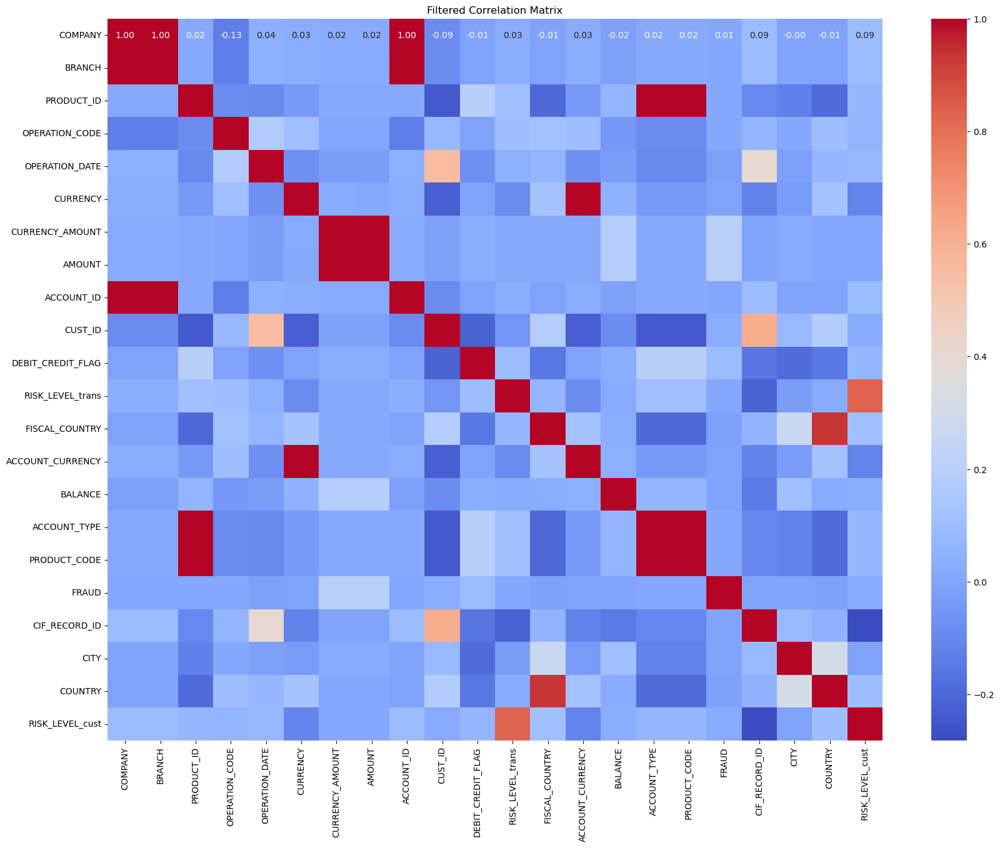

Significant columns for EDA and ML:
Index(['COMPANY', 'BRANCH', 'PRODUCT_ID', 'OPERATION_CODE', 'OPERATION_DATE',
       'CURRENCY', 'CURRENCY_AMOUNT', 'AMOUNT', 'ACCOUNT_ID', 'CUST_ID',
       'DEBIT_CREDIT_FLAG', 'RISK_LEVEL_trans', 'FISCAL_COUNTRY',
       'ACCOUNT_CURRENCY', 'BALANCE', 'ACCOUNT_TYPE', 'PRODUCT_CODE', 'FRAUD',
       'CIF_RECORD_ID', 'CITY', 'COUNTRY', 'RISK_LEVEL_cust'],
      dtype='object')


In [18]:
label_cols = ['COMPANY', 'BRANCH', 'CURRENCY', 'DEBIT_CREDIT_FLAG',  'FISCAL_COUNTRY', 'ACCOUNT_CURRENCY', 'CITY', 'COUNTRY']
label_encoder = LabelEncoder()

for col in label_cols:
    df[col] = label_encoder.fit_transform(df[col])

# Compute the correlation matrix
correlation_matrix = df.corr()

correlation_threshold = 0.8
significant_columns = correlation_matrix.columns[correlation_matrix.abs().sum() > correlation_threshold]

# Filter the DataFrame to keep only significant columns
df_filtered = df[significant_columns]

# Plot the correlation matrix for the filtered DataFrame
plt.figure(figsize=(20, 15))
sns.heatmap(df_filtered.corr(), annot=True, fmt='.2f', cmap='coolwarm')
plt.title('Filtered Correlation Matrix')
plt.show()

# Display the significant columns
print("Significant columns for EDA and ML:")
print(significant_columns)

## EDA

C:\Program Files\Anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


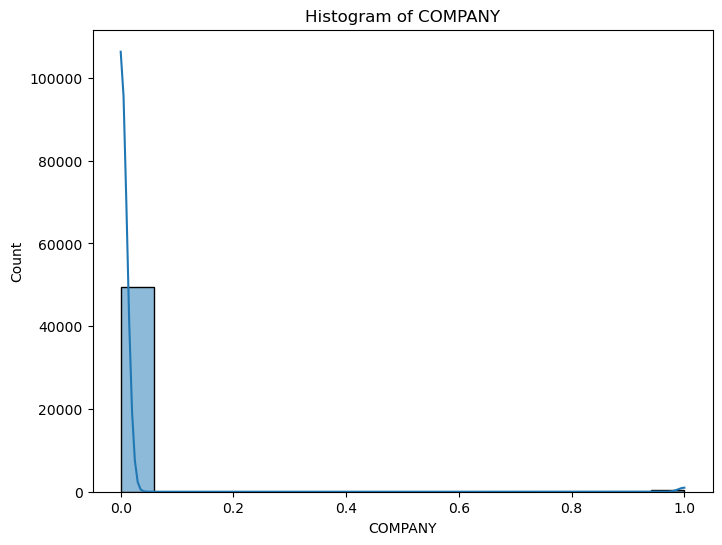

C:\Program Files\Anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


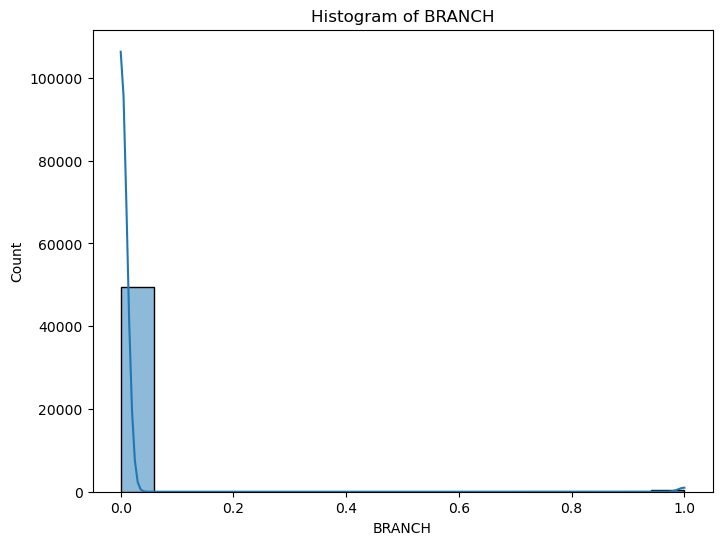

C:\Program Files\Anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


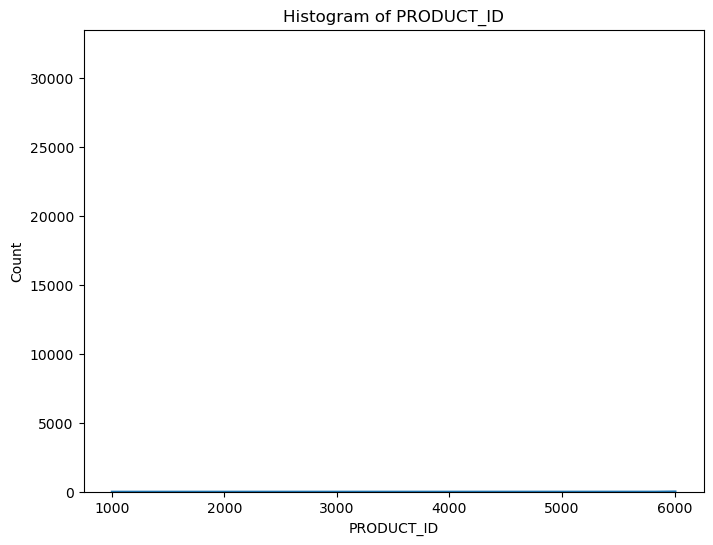

C:\Program Files\Anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


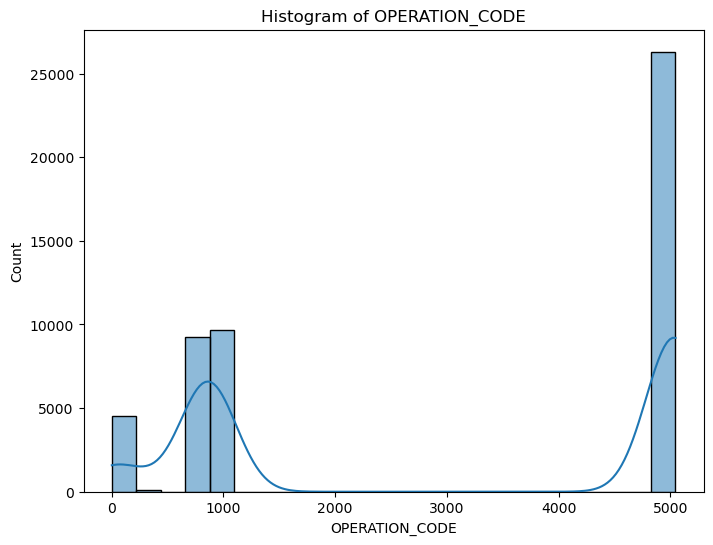

C:\Program Files\Anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


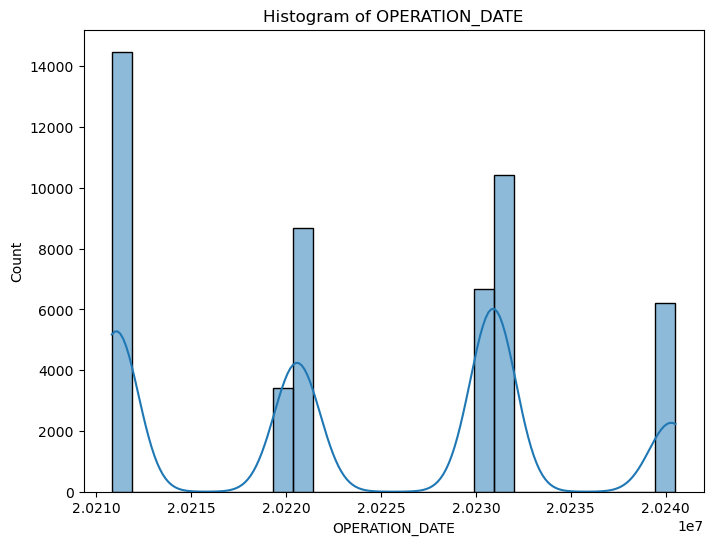

C:\Program Files\Anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


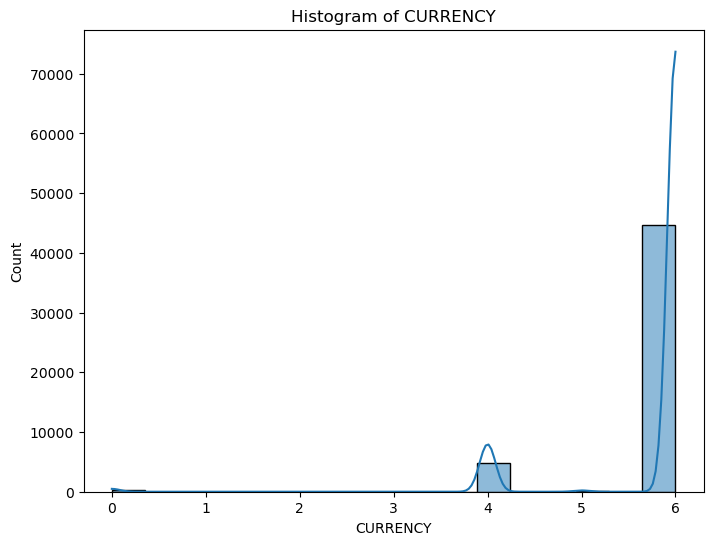

C:\Program Files\Anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


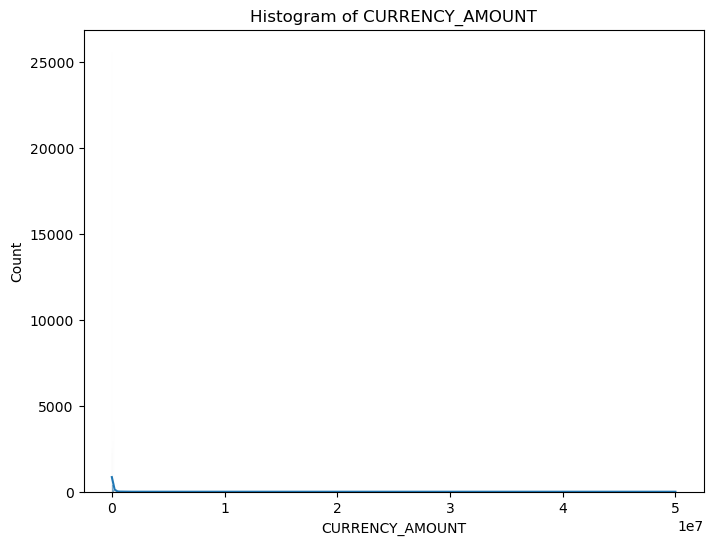

C:\Program Files\Anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


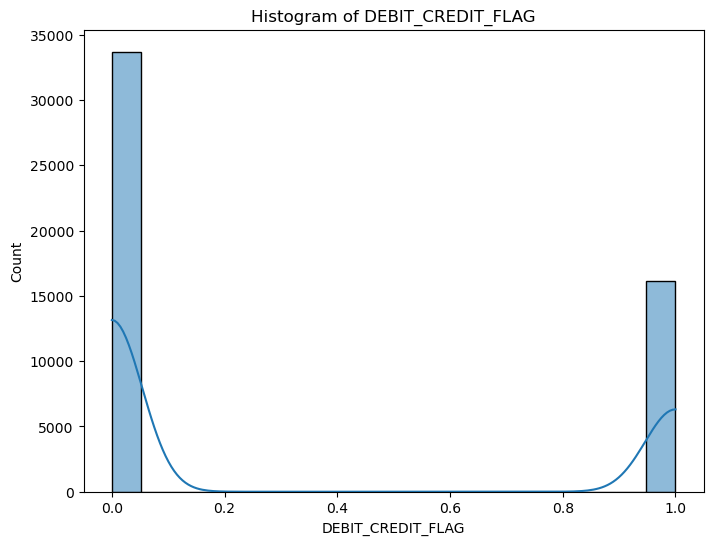

C:\Program Files\Anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


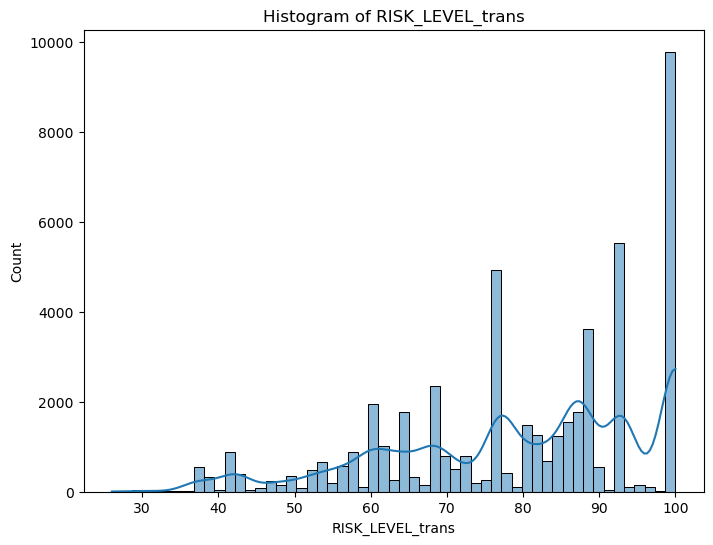

C:\Program Files\Anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


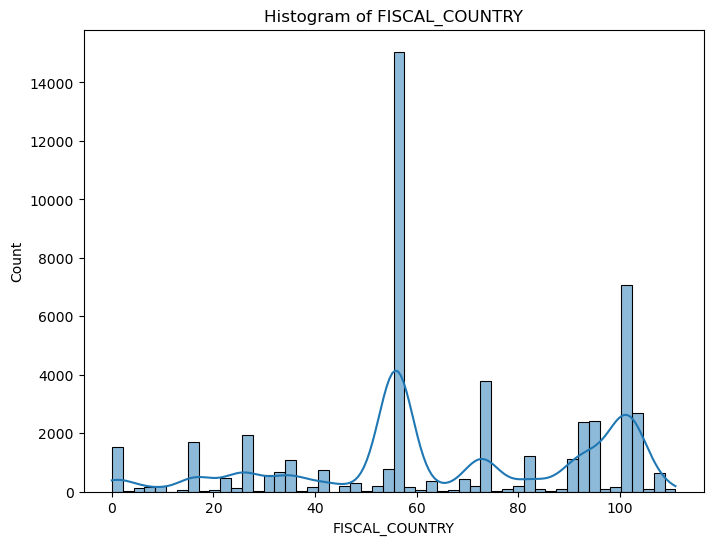

C:\Program Files\Anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


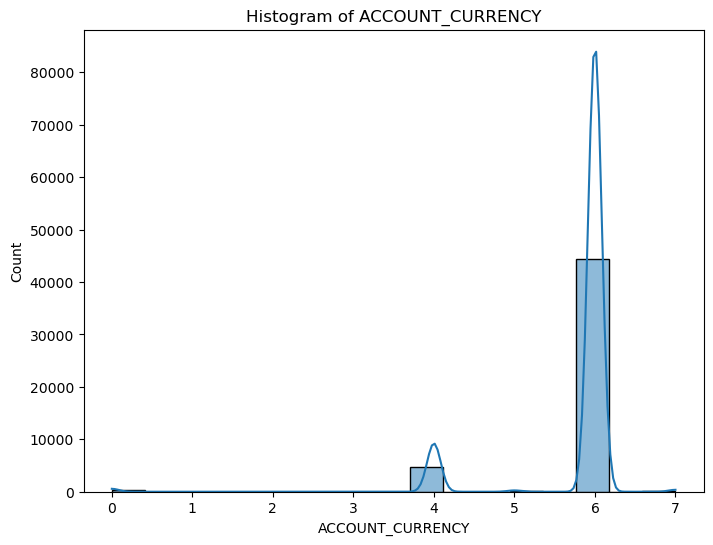

C:\Program Files\Anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


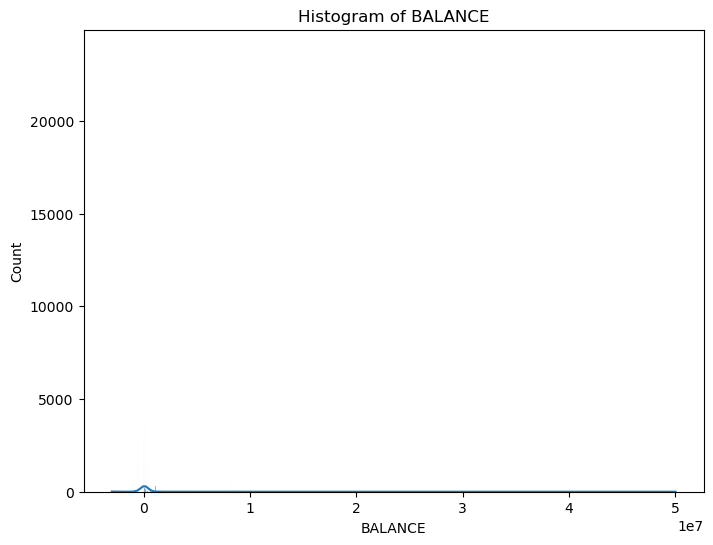

C:\Program Files\Anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


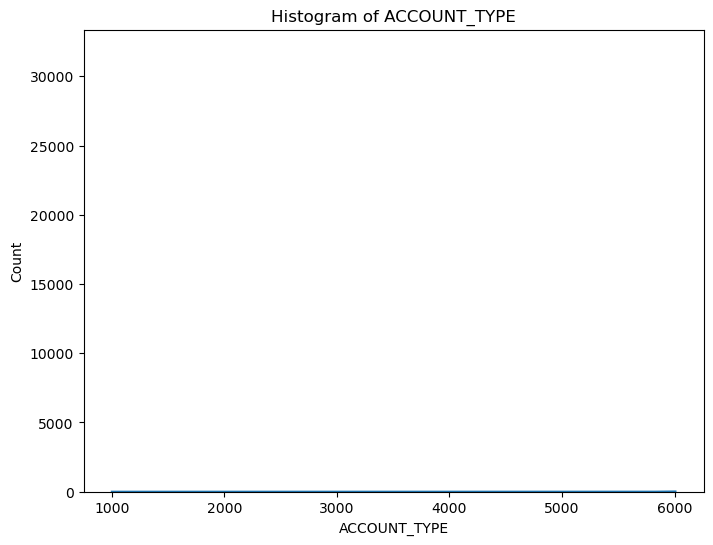

C:\Program Files\Anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


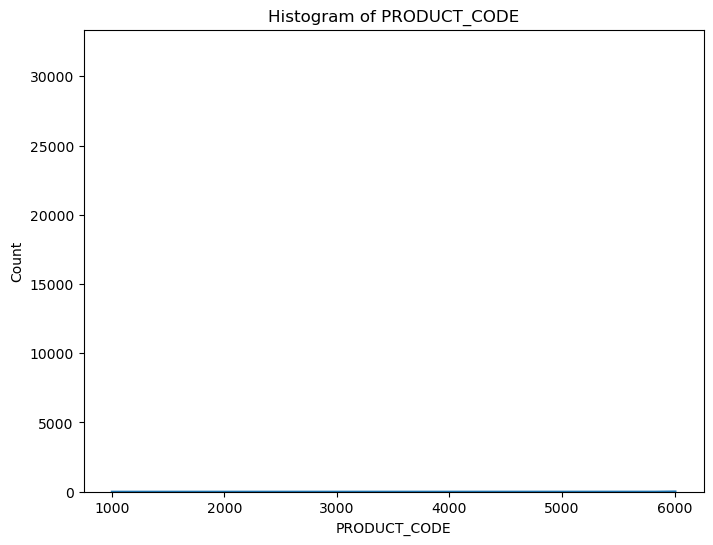

C:\Program Files\Anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


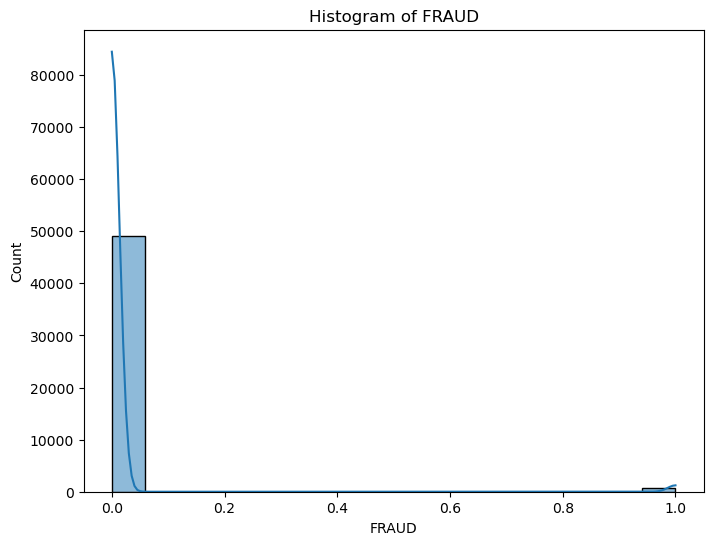

C:\Program Files\Anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


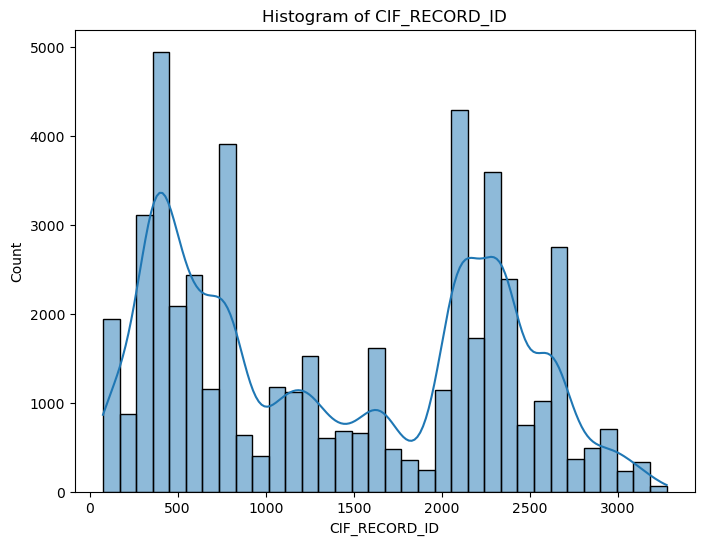

C:\Program Files\Anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


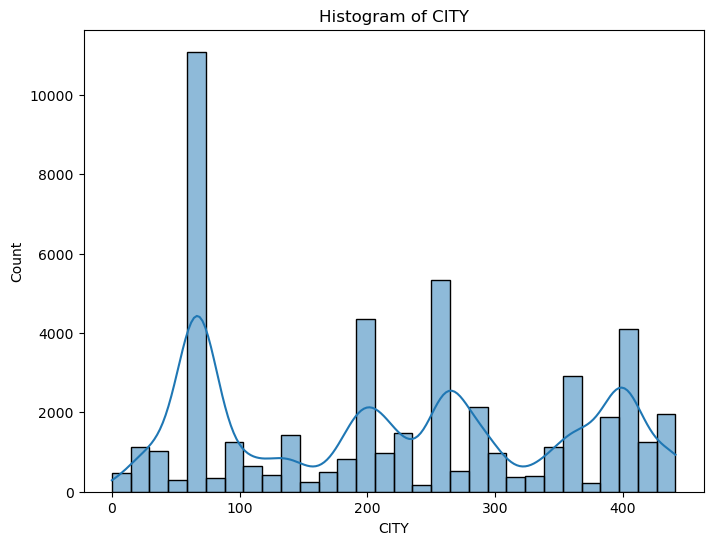

C:\Program Files\Anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


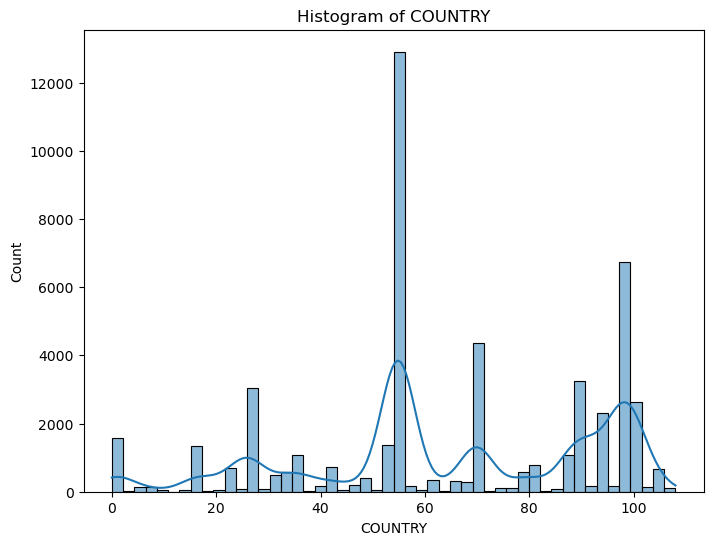

C:\Program Files\Anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


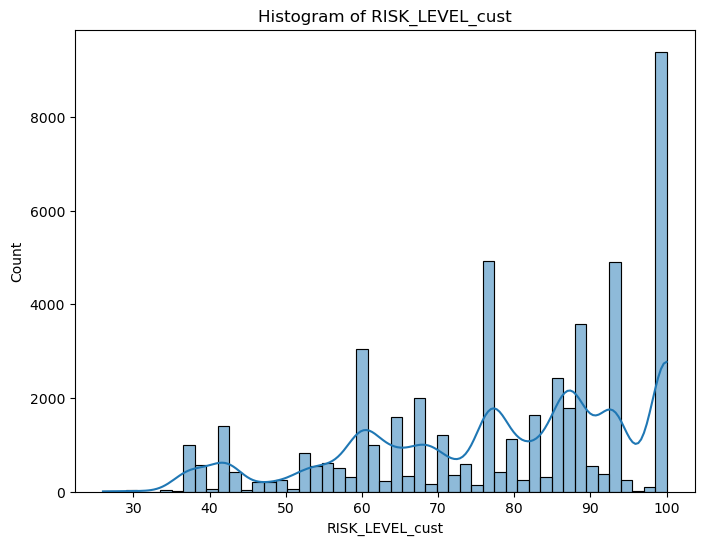

In [19]:
# Histograms for each significant column
for col in significant_columns:
    if col in ['ACCOUNT_ID' ,'CUST_ID', 'AMOUNT']:
        continue
    plt.figure(figsize=(8, 6))
    sns.histplot(df_filtered[col], kde=True)
    plt.title(f'Histogram of {col}')
    plt.show()

In [ ]:
# Box plots for each significant column
for col in significant_columns:
    plt.figure(figsize=(8, 6))
    sns.boxplot(x=df_filtered[col])
    plt.title(f'Box Plot of {col}')
    plt.show()

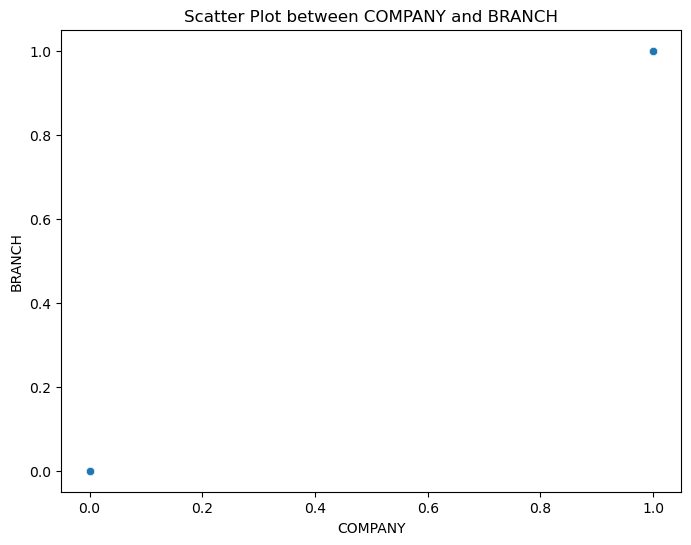

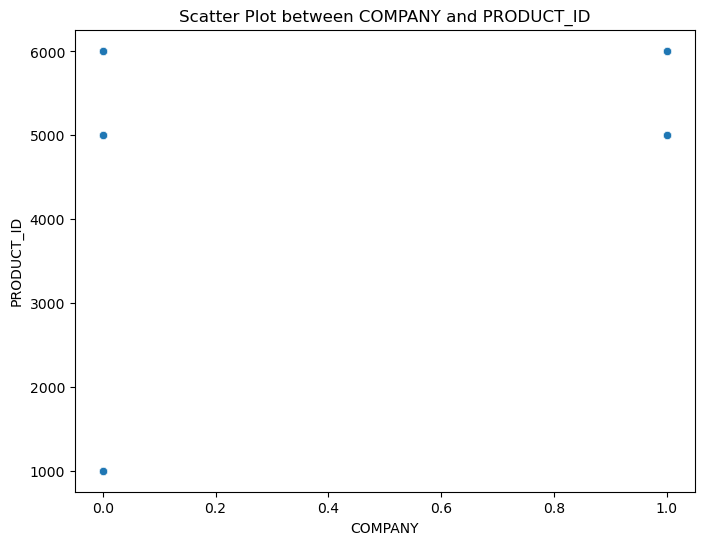

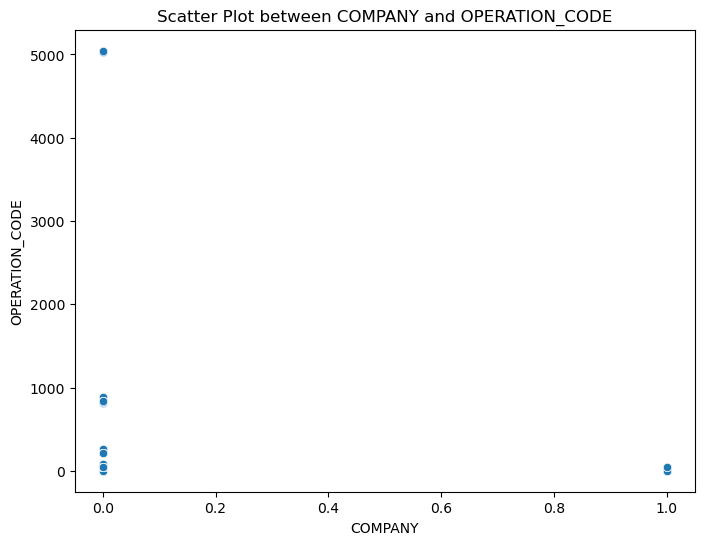

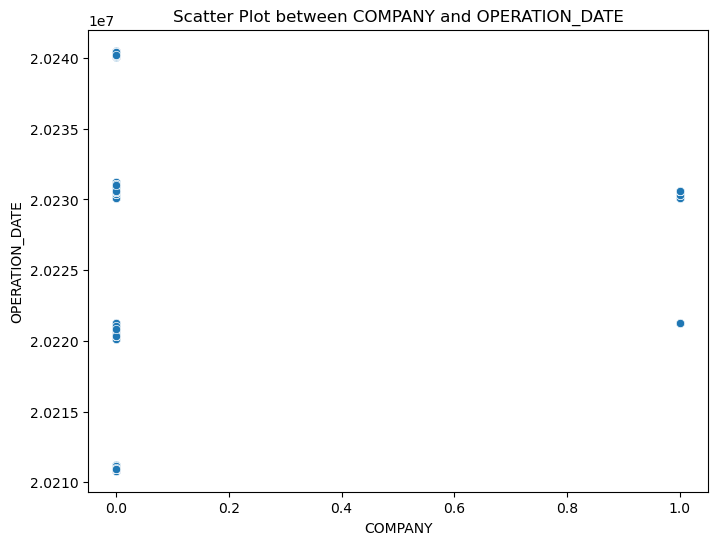

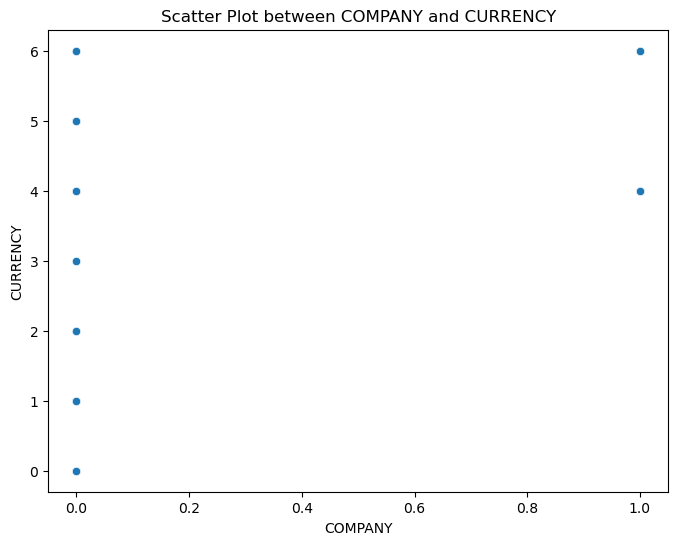

...

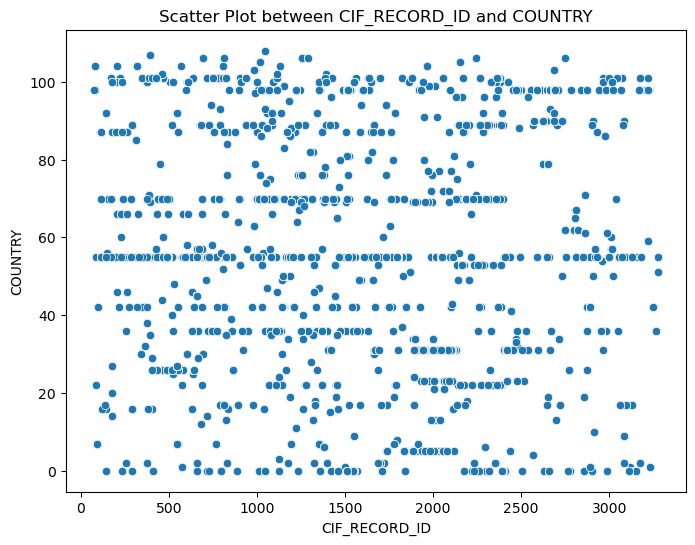

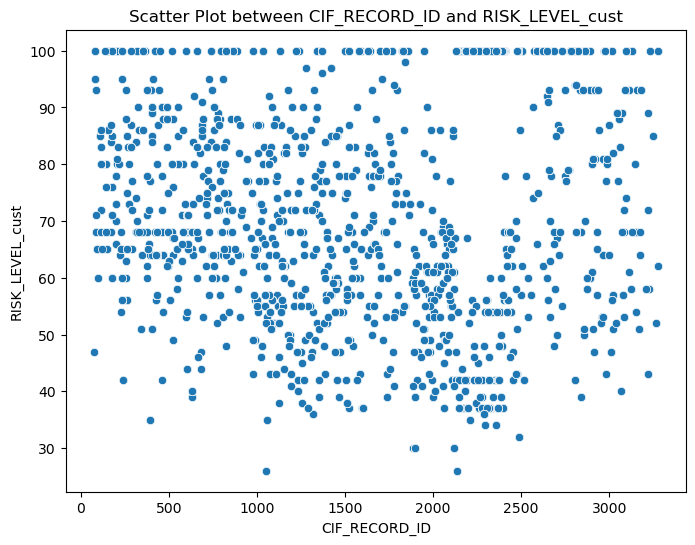

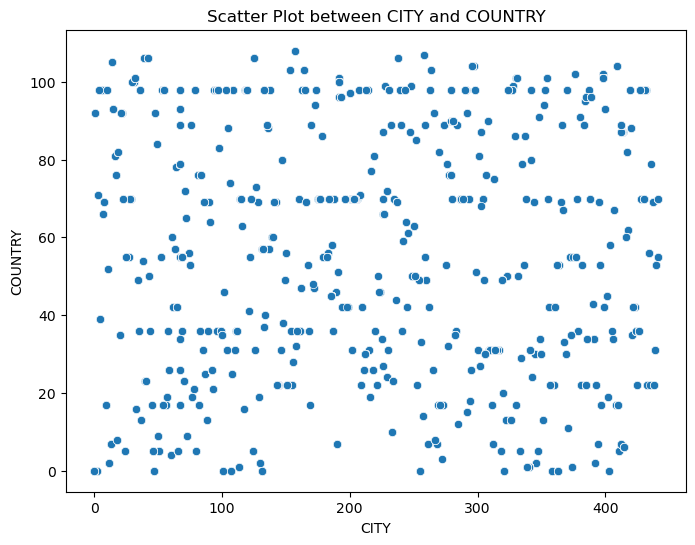

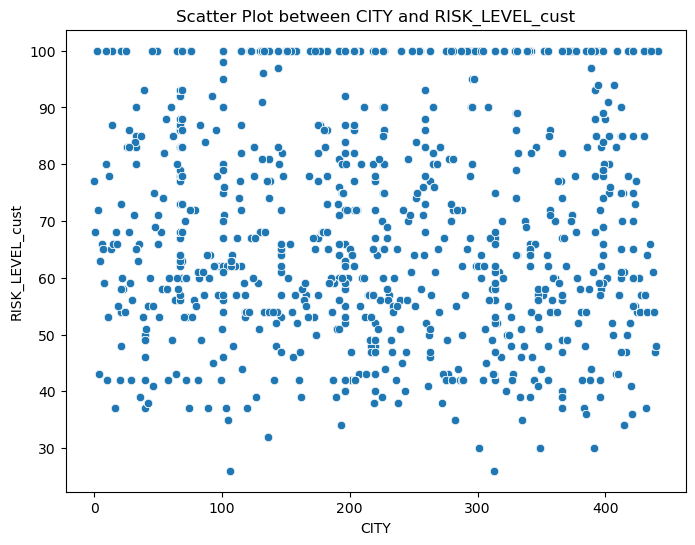

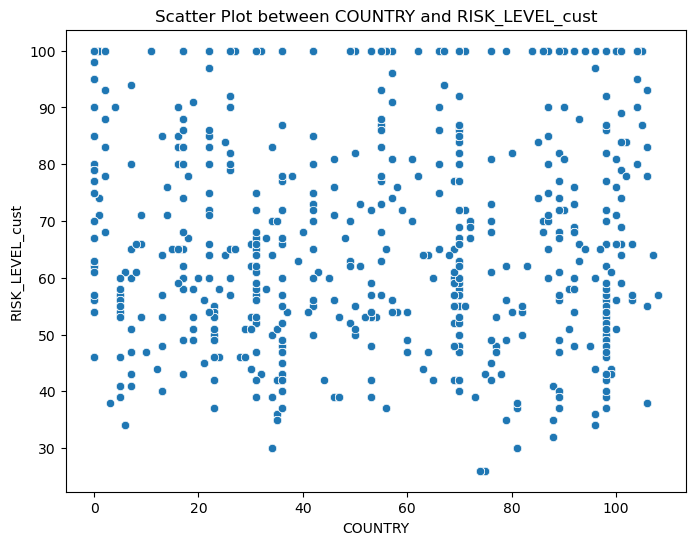

In [21]:
# Scatter plots for each pair of significant columns
for i in range(len(significant_columns)):
    for j in range(i+1, len(significant_columns)):
        plt.figure(figsize=(8, 6))
        sns.scatterplot(x=df_filtered[significant_columns[i]], y=df_filtered[significant_columns[j]])
        plt.title(f'Scatter Plot between {significant_columns[i]} and {significant_columns[j]}')
        plt.show()

C:\Program Files\Anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Program Files\Anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Program Files\Anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Program Files\Anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before o

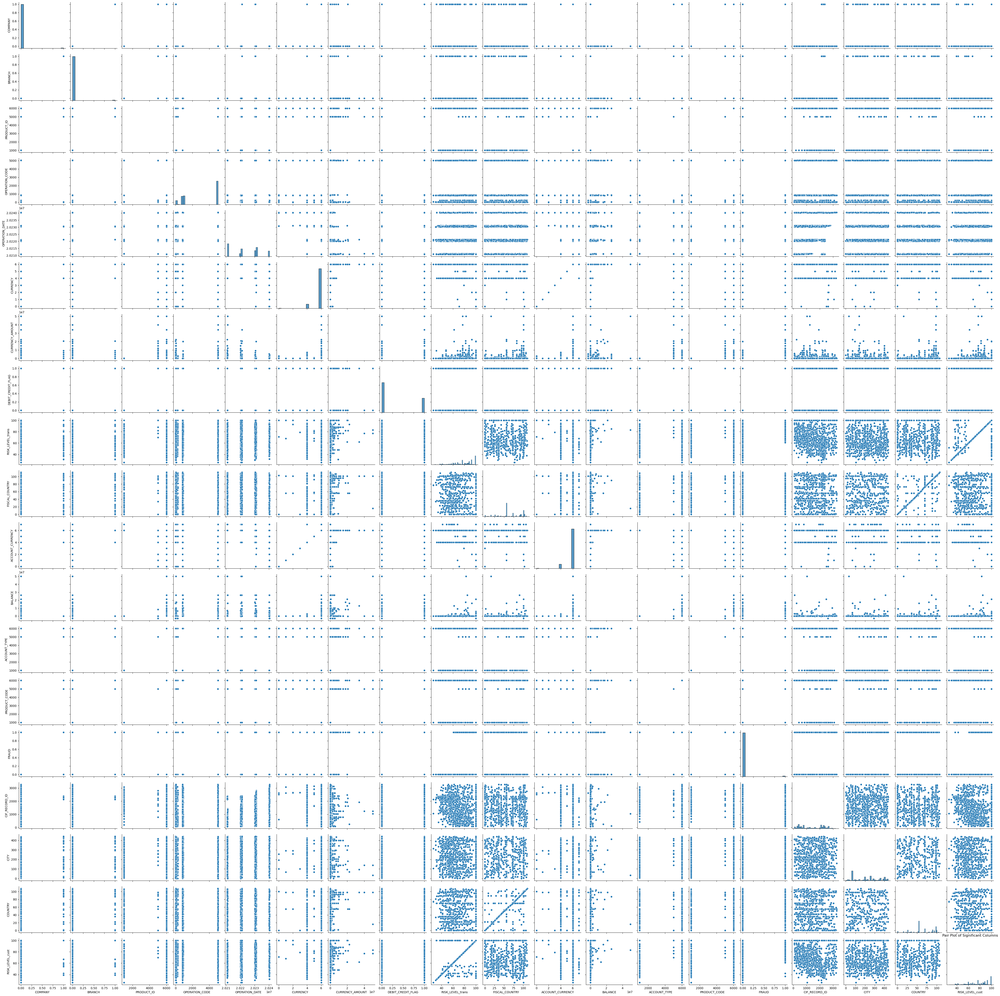

In [23]:
df_filtered_1 = df_filtered.drop(['ACCOUNT_ID' ,'CUST_ID', 'AMOUNT'], axis=1)
sns.pairplot(df_filtered_1)
plt.title('Pair Plot of Significant Columns')
plt.show()


In [26]:
# for col in significant_columns:
#     plt.figure(figsize=(8, 6))
#     sns.violinplot(x=df_filtered[col])
#     plt.title(f'Violin Plot of {col}')
#     plt.show()

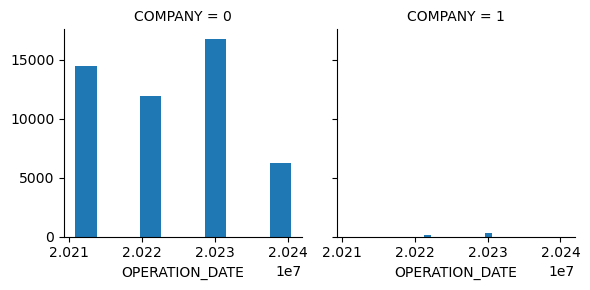

In [27]:
# Facet Grid for visualizing multiple plots
g = sns.FacetGrid(df_filtered, col="COMPANY")
g.map(plt.hist, "OPERATION_DATE")
plt.show()